In [1]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from reglas import *

In [2]:
df =pd.read_csv('Datos\Transformados\df_unificado_colores.csv')

<>:1: SyntaxWarning: "\T" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\T"? A raw string is also an option.
<>:1: SyntaxWarning: "\T" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\T"? A raw string is also an option.
C:\Users\lande\AppData\Local\Temp\ipykernel_27040\4054734974.py:1: SyntaxWarning: "\T" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\T"? A raw string is also an option.
  df =pd.read_csv('Datos\Transformados\df_unificado_colores.csv')
C:\Users\lande\AppData\Local\Temp\ipykernel_27040\4054734974.py:1: DtypeWarning: Columns (12,13,16,18,20,21,24) have mixed types. Specify dtype option on import or set low_memory=False.
  df =pd.read_csv('Datos\Transformados\df_unificado_colores.csv')


In [3]:
df['tipo_prenda'].unique()

array(['sweater', 'pant', 'top', 'jeans', 'dress', 'shirt', 'tshirt',
       'jacket', 'skirt', 'parka', 'jumpsuit', 'bag', 'cardigan', 'short',
       'scarf', 't-shirt', 'foulard', 'trench', 'coat', 'playsuit',
       'sweatshirt', 'jackect', 'pullover', 'falda', 'jean', 'shorts',
       'jakect'], dtype=object)

In [4]:
df['ID_color'] = df['ID'] + df['Color']

prendas = df['ID_color'].unique().tolist()
len(prendas)

1732

In [5]:
df_grafo = df[['ID_color', 'nivel', 'Color', 'color_nivel', 'Temporada', 'Marca', 'ID']]
df_grafo = df_grafo.drop_duplicates()
df_grafo['ID_nuevo'] = [i for i in range(1, len(df_grafo)+1)]

In [6]:
df_grafo['color_nivel'].nunique()

43

In [7]:
colores = ['red', 'blue', 'green']

color_nodo = [colores[i-1] for i in df_grafo['nivel']]

In [8]:
df_grafo[:20]

,ID_color,nivel,Color,color_nivel,Temporada,Marca,ID,ID_nuevo
0,6549c1b1-989e-432a-bdc9-b603c438b310yellow,2,yellow,54,9,BRAND119,6549c1b1-989e-432a-bdc9-b603c438b310,1
23,6549c1b1-989e-432a-bdc9-b603c438b310ecru,2,ecru,51,9,BRAND119,6549c1b1-989e-432a-bdc9-b603c438b310,2
69,6549c1b1-989e-432a-bdc9-b603c438b310blue_dark,2,blue_dark,100,9,BRAND119,6549c1b1-989e-432a-bdc9-b603c438b310,3
345,350b09b1-9156-468f-a7e8-b99cec0d6f6eblack,1,black,0,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,4
429,350b09b1-9156-468f-a7e8-b99cec0d6f6eblue_dark,1,blue_dark,100,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,5
457,350b09b1-9156-468f-a7e8-b99cec0d6f6egray_light,1,gray_light,2,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,6
513,350b09b1-9156-468f-a7e8-b99cec0d6f6ekhaki,1,khaki,50,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,7
597,350b09b1-9156-468f-a7e8-b99cec0d6f6ebrown,1,brown,30,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,8
1045,965805d4-5a1a-4779-a42a-b10866deef3dblack,2,black,0,9,BRAND167,965805d4-5a1a-4779-a42a-b10866deef3d,9
1170,f7b1efdf-c846-4ee2-8454-19c628097adbindigo,2,indigo,113,9,BRAND167,f7b1efdf-c846-4ee2-8454-19c628097adb,10


In [9]:
prendas_c =df_grafo.set_index('ID_nuevo').to_dict('index')
G_corto = nx.Graph()
G_corto.add_nodes_from(prendas_c)
len(G_corto.nodes)

1732

In [10]:
dffinal = pd.read_csv('Datos/Transformados/df_unificado_colores.csv')
df_unicos = dffinal.drop_duplicates(subset=['ID','Color']).reset_index(drop=True)
df_unicos

C:\Users\lande\AppData\Local\Temp\ipykernel_27040\3883249474.py:1: DtypeWarning: Columns (12,13,16,18,20,21,24) have mixed types. Specify dtype option on import or set low_memory=False.
  dffinal = pd.read_csv('Datos/Transformados/df_unificado_colores.csv')


,ID,Titulo,Temporada,Color,Lookiero,Marca,Caracteristica,Caracteristica1,tipo_prenda,nivel,...,fit1,fit2,print1,print2,print3,style1,style2,style3,tipo_prenda2,color_nivel
0,6549c1b1-989e-432a-bdc9-b603c438b310,Onleden Sweater knt,9,yellow,M,BRAND119,sweaters,top_type,sweater,2,...,loose,NaN,smooth,NaN,NaN,classic,boho,NaN,jersey,54
1,6549c1b1-989e-432a-bdc9-b603c438b310,Onleden Sweater knt,9,ecru,M,BRAND119,sweaters,top_type,sweater,2,...,loose,NaN,smooth,NaN,NaN,classic,boho,NaN,jersey,51
2,6549c1b1-989e-432a-bdc9-b603c438b310,Onleden Sweater knt,9,blue_dark,XS,BRAND119,sweaters,top_type,sweater,2,...,loose,NaN,smooth,NaN,NaN,classic,boho,NaN,jersey,100
3,350b09b1-9156-468f-a7e8-b99cec0d6f6e,Cherry Pant plain T. L C. brown,9,black,XL,BRAND15,cigarett,down_part_type,pant,1,...,straight,NaN,smooth,NaN,NaN,classic,minimal,NaN,pantalones,0
4,350b09b1-9156-468f-a7e8-b99cec0d6f6e,Cherry Pant plain T. L C. brown,9,blue_dark,L,BRAND15,cigarett,down_part_type,pant,1,...,straight,NaN,smooth,NaN,NaN,classic,minimal,NaN,pantalones,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1727,50701dda-a3f4-4b59-8698-da3757382574,Lines Top cerise,9,green_light,L,BRAND15,tops,top_type,top,2,...,straight,NaN,vertical_stripes,NaN,NaN,boho,NaN,NaN,camiseta,75
1728,50701dda-a3f4-4b59-8698-da3757382574,Lines Top cerise,9,yellow,L,BRAND15,tops,top_type,top,2,...,straight,NaN,vertical_stripes,NaN,NaN,boho,NaN,NaN,camiseta,54
1729,50701dda-a3f4-4b59-8698-da3757382574,Lines Top cerise,9,pink,L,BRAND15,tops,top_type,top,2,...,straight,NaN,vertical_stripes,NaN,NaN,boho,NaN,NaN,camiseta,15
1730,22efc184-5ecb-401d-8dea-9569ceae492d,Jara Short pant,9,red,L,BRAND15,shorts,down_part_type,short,1,...,straight,NaN,floral,NaN,NaN,boho,classic,NaN,pantalones,12


In [ ]:
import pandas as pd
import networkx as nx
import itertools

# --- DEFINICIÓN DE CONSTANTES (Fuera de la función para velocidad) ---
C_RELAXED = {'casual', 'street', 'freetime'}
C_FORMAL  = {'classic', 'minimal', 'work', 'working_girl'}
C_BOHO    = {'boho'}
C_PARTY   = {'night', 'special_occasion'}
G_LISO  = {'smooth', 'solid', 'liso'}
G_MICRO = {'miniprint', 'bodoque', 'two_tone'}
G_RAYAS = {'horizontal_stripes', 'vertical_stripes', 'diagonal_stripe', 'mariniere'}
G_CUADROS = {'checked', 'vichy', 'tartan', 'rhombus_fabric', 'geometric', 'prince_of_wales'}
G_ORGANICOS = {'floral', 'liberty', 'tropical', 'sheets', 'cachemere', 'tie_dye', 'gradient', 'tapestry'}
G_GEOMETRICOS = {'geometric', 'retro', 'ethnic', 'rhombus_fabric', 'herringbone', 'pied_de_poule'}
G_PUNTOS={'polka_dot'}
G_AUDACES = {'animal_print', 'camouflage', 'army'}
LISOS_SET = {'none', 'nan', '', 'sin estampado'}

# ==========================================
# EJECUCIÓN DEL FLUJO
# ==========================================
print("🚀 Generando diccionario de prendas (prendas_c)...")
cols_st = ['style1', 'style2', 'style3', 'application1', 'application2', 'application3', 'application4']
cols_pr = ['print1', 'print2', 'print3']
cols_ft = ['fit1', 'fit2']
prendas_c = {}
df_unicos = df_grafo.copy()

for idx, row in df_unicos.iterrows():
    try: cn = int(float(row.get('color_nivel', 0)))
    except: cn = 0 
    st = {str(row.get(c, '')).lower() for c in cols_st} - {'nan', '', 'none'}
    pr = {str(row.get(c, '')).lower() for c in cols_pr} - {'nan', '', 'none'}
    ft = {str(row.get(c, '')).lower() for c in cols_ft} - {'nan', '', 'none'}
    prenda_procesada = {
        'id': row['ID_nuevo'],
        'color_nivel': cn,
        'nivel': row.get('nivel'),
        'styles': st,
        'has_style': bool(st),
        'prints': pr,
        'is_print': (bool(pr) and pr.isdisjoint(LISOS_SET)),
        'fits': ft,
        'lookiero_id': row.get('Lookiero'), 
        'temporada': row.get('Temporada')}
    
    prendas_c[row['ID_nuevo']] = prenda_procesada

# 2. Construcción del Grafo
print(f"🚀 Iniciando combinaciones con {len(prendas_c)} prendas únicas...")
G_corto = nx.Graph()
G_corto.add_nodes_from(prendas_c.keys())
count = 0
for id_A, id_B in itertools.combinations(prendas_c.keys(), 2):
    prenda_A = prendas_c[id_A]
    prenda_B = prendas_c[id_B]
    if prenda_A.get('lookiero_id') != prenda_B.get('lookiero_id'):
       continue
    if validar_par_final(prenda_A, prenda_B):
        G_corto.add_edge(id_A, id_B)
        count += 1

print(f"✅ Grafo construido: {G_corto.number_of_nodes()} nodos y {G_corto.number_of_edges()} aristas.")

🚀 Generando diccionario de prendas (prendas_c)...
🚀 Iniciando combinaciones con 1732 prendas únicas...
✅ Grafo construido: 1732 nodos y 895212 aristas.


In [12]:
print('Cantindad de nodos:',len(G_corto.nodes))
print('Cantindad de aristas:',len(G_corto.edges))

Cantindad de nodos: 1732
Cantindad de aristas: 895212


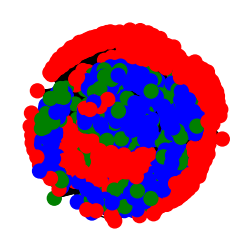

In [13]:
fig, ax = plt.subplots(figsize = (3,3))

color_nodo1000 = [colores[i-1] for i in df_grafo['nivel']]
nx.draw(G_corto, node_color=color_nodo1000, node_size=100,width=1)

In [14]:
# Diccionario: {ID_nodo : color}
color_nodo = {
    row.ID_nuevo: colores[row.nivel - 1]
    for _, row in df_grafo.iterrows()}

In [15]:
faltan = [n for n in G_corto.nodes if n not in color_nodo]
faltan

[]

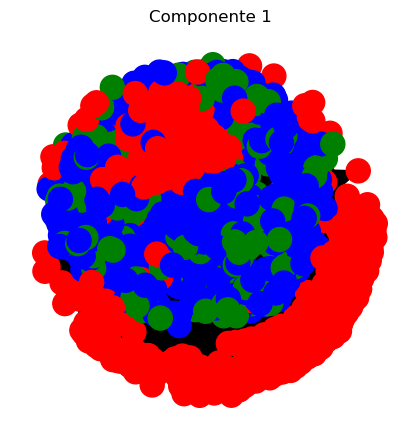

In [ ]:
componentes = nx.connected_components(G_corto)

for i, comp in enumerate(componentes):
    subG = G_corto.subgraph(comp)

    # lista de colores SOLO para los nodos del subgrafo
    colores_sub = [color_nodo[n] for n in subG.nodes()]
    plt.figure(figsize=(4, 4))
    nx.draw(
        subG,
        with_labels=False,
        node_size=300,
        node_color=colores_sub)
    plt.title(f"Componente {i+1}")
    plt.show()

In [17]:
nodos_grado_1 = [n for n, d in G_corto.degree() if d < 300]
len(nodos_grado_1)

0

In [18]:
triangulos_dict = nx.triangles(G_corto)
triangulos_dict

{1: 404219,
 2: 292145,
 3: 216802,
 4: 434354,
 5: 102590,
 6: 434354,
 7: 142336,
 8: 140131,
 9: 893481,
 10: 486792,
 11: 893481,
 12: 893481,
 13: 288251,
 14: 434354,
 15: 102590,
 16: 434354,
 17: 546378,
 18: 292145,
 19: 142621,
 20: 434354,
 21: 102590,
 22: 292145,
 23: 292145,
 24: 893481,
 25: 292145,
 26: 893481,
 27: 436691,
 28: 893481,
 29: 220407,
 30: 893481,
 31: 216802,
 32: 418747,
 33: 288251,
 34: 893481,
 35: 220407,
 36: 434354,
 37: 146578,
 38: 143765,
 39: 434354,
 40: 220407,
 41: 303707,
 42: 421942,
 43: 493591,
 44: 216802,
 45: 292145,
 46: 241386,
 47: 292250,
 48: 525498,
 49: 434354,
 50: 358942,
 51: 241386,
 52: 102590,
 53: 893481,
 54: 893481,
 55: 142336,
 56: 434354,
 57: 434354,
 58: 220407,
 59: 303707,
 60: 893481,
 61: 289973,
 62: 292145,
 63: 893481,
 64: 546378,
 65: 893481,
 66: 512326,
 67: 893481,
 68: 252002,
 69: 216802,
 70: 292145,
 71: 292250,
 72: 893481,
 73: 292145,
 74: 436691,
 75: 142621,
 76: 893481,
 77: 288251,
 78: 546

In [19]:
df_grafo['num_triangulos'] = df_grafo['ID_nuevo'].map(triangulos_dict).fillna(0).astype(int)

In [20]:
df_grafo

,ID_color,nivel,Color,color_nivel,Temporada,Marca,ID,ID_nuevo,num_triangulos
0,6549c1b1-989e-432a-bdc9-b603c438b310yellow,2,yellow,54,9,BRAND119,6549c1b1-989e-432a-bdc9-b603c438b310,1,404219
23,6549c1b1-989e-432a-bdc9-b603c438b310ecru,2,ecru,51,9,BRAND119,6549c1b1-989e-432a-bdc9-b603c438b310,2,292145
69,6549c1b1-989e-432a-bdc9-b603c438b310blue_dark,2,blue_dark,100,9,BRAND119,6549c1b1-989e-432a-bdc9-b603c438b310,3,216802
345,350b09b1-9156-468f-a7e8-b99cec0d6f6eblack,1,black,0,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,4,434354
429,350b09b1-9156-468f-a7e8-b99cec0d6f6eblue_dark,1,blue_dark,100,9,BRAND15,350b09b1-9156-468f-a7e8-b99cec0d6f6e,5,102590
...,...,...,...,...,...,...,...,...,...
198235,50701dda-a3f4-4b59-8698-da3757382574green_light,2,green_light,75,9,BRAND15,50701dda-a3f4-4b59-8698-da3757382574,1728,320199
198304,50701dda-a3f4-4b59-8698-da3757382574yellow,2,yellow,54,9,BRAND15,50701dda-a3f4-4b59-8698-da3757382574,1729,404219
198350,50701dda-a3f4-4b59-8698-da3757382574pink,2,pink,15,9,BRAND15,50701dda-a3f4-4b59-8698-da3757382574,1730,421942
198465,22efc184-5ecb-401d-8dea-9569ceae492dred,1,red,12,9,BRAND15,22efc184-5ecb-401d-8dea-9569ceae492d,1731,220407


In [21]:
triangulos = [c for c in nx.cycle_basis(G_corto) if len(c) == 3]
len(triangulos)

668605

In [ ]:
triangulos_validos = []

for tri in triangulos:
    niveles = [prendas_c[n]['nivel'] for n in tri]
    # condición: exactamente un nivel 1
    if niveles.count(1) == 1 and all(n in [1,2,3] for n in niveles):
        # condición adicional: los otros dos deben ser 2 o 3
        niveles_sin_1 = [n for n in niveles if n != 1]
        if all(n in [2, 3] for n in niveles_sin_1):
            triangulos_validos.append(tri)

In [23]:
len(triangulos_validos)

550987

In [24]:
df_grafo[df_grafo['ID_nuevo'].isin([177, 670, 994])]

,ID_color,nivel,Color,color_nivel,Temporada,Marca,ID,ID_nuevo,num_triangulos
20201,64334c2b-503b-463a-a82d-aca96e9e231dblue_dark,3,blue_dark,100,9,BRAND143,64334c2b-503b-463a-a82d-aca96e9e231d,177,216802
75091,c11e2bfb-988b-4c0d-b865-76c9884d4529brown,2,brown,30,9,BRAND58,c11e2bfb-988b-4c0d-b865-76c9884d4529,670,292250
110593,480fd7d2-5ef3-46cc-9733-5347838b97e2blue_dark,1,blue_dark,100,9,BRAND35,480fd7d2-5ef3-46cc-9733-5347838b97e2,994,102590


In [25]:
triangulos_validos[10000:10020]

[[1621, 1381, 1727],
 [1625, 1381, 1727],
 [1628, 1381, 1727],
 [1633, 1381, 1727],
 [1635, 1381, 1727],
 [1644, 1381, 1727],
 [1645, 1381, 1727],
 [1653, 1381, 1727],
 [1660, 1381, 1727],
 [1661, 1381, 1727],
 [1662, 1381, 1727],
 [1667, 1381, 1727],
 [1669, 1381, 1727],
 [1676, 1381, 1727],
 [1680, 1381, 1727],
 [1681, 1381, 1727],
 [1684, 1381, 1727],
 [1715, 1381, 1727],
 [9, 1380, 1727],
 [11, 1380, 1727]]

In [26]:
G_corto.edges()

EdgeView([(1, 2), (1, 4), (1, 6), (1, 7), (1, 9), (1, 10), (1, 11), (1, 12), (1, 14), (1, 16), (1, 17), (1, 18), (1, 20), (1, 22), (1, 23), (1, 24), (1, 25), (1, 26), (1, 27), (1, 28), (1, 29), (1, 30), (1, 32), (1, 34), (1, 35), (1, 36), (1, 39), (1, 40), (1, 42), (1, 43), (1, 45), (1, 46), (1, 48), (1, 49), (1, 51), (1, 53), (1, 54), (1, 55), (1, 56), (1, 57), (1, 58), (1, 60), (1, 62), (1, 63), (1, 64), (1, 65), (1, 66), (1, 67), (1, 68), (1, 70), (1, 72), (1, 73), (1, 74), (1, 76), (1, 78), (1, 80), (1, 81), (1, 82), (1, 83), (1, 84), (1, 85), (1, 87), (1, 88), (1, 89), (1, 92), (1, 93), (1, 94), (1, 95), (1, 97), (1, 99), (1, 100), (1, 103), (1, 107), (1, 110), (1, 111), (1, 114), (1, 115), (1, 118), (1, 119), (1, 120), (1, 121), (1, 122), (1, 123), (1, 124), (1, 126), (1, 127), (1, 128), (1, 129), (1, 130), (1, 132), (1, 136), (1, 137), (1, 138), (1, 139), (1, 140), (1, 141), (1, 142), (1, 143), (1, 145), (1, 147), (1, 148), (1, 151), (1, 152), (1, 153), (1, 155), (1, 156), (1, 1

In [27]:
G = nx.Graph()
G.add_nodes_from(prendas)

In [28]:
estampados = df[df['Caracteristica1']== 'print']['Caracteristica'].unique()

In [29]:
for i, est in enumerate(estampados):
    print(i, ': ', est)

0 :  smooth
1 :  animal_print
2 :  sheets
3 :  bodoque
4 :  miniprint
5 :  retro
6 :  herringbone
7 :  horizontal_stripes
8 :  vertical_stripes
9 :  printed
10 :  floral
11 :  ethnic
12 :  checked
13 :  geometric
14 :  liberty
15 :  polka_dot
16 :  other
17 :  tie_dye
18 :  two_tone
19 :  camouflage
20 :  cachemere
21 :  tropical
22 :  tapestry
23 :  prince_of_wales
24 :  diagonal_stripe
